# 현대 포트폴리오 이론 (Modern Portfolio Theory)

## 포트폴리오 구성

- 종목별로 비중을 어떻게 배분하느냐에 따라 성과가 달라지므로, 종목의 선택 못지 않게 중요한 것이 포트폴리오를 구성하는 방법이다. 

- 최적 포트폴리오의 구성은 수식을 기반으로 최적화된 해를 찾는다. 

- 물론 엑셀의 해 찾기와 같은 기능을 사용해 간단한 형태의 최적화 구현이 가능하지만, 방대한 데이터를 다룰 경우에는 속도가 지나치게 느려지거나 계산할 수 없게 되기도 한다

- 사실 포트폴리오 구성하고 백테스트 하는 과정은 R이 훨씬 편하지만, 우리는 파이썬을 배우기 때문에 파이썬으로 최소분산포트폴리오를 구성해보겠다.

In [1]:
# 2020년 여름방학 기준 시총 상위 5개의 종목으로 간단한 포트폴리오를 구성해서 최소분산포트폴리오를 구성하고 비중을 구해보자

import numpy as np
import pandas as pd
import sqlite3
import matplotlib.pyplot as plt
import FinanceDataReader as fdr
import os

stocks = ['삼성전자', 'SK하이닉스', '삼성바이오로직스', 'NAVER', '셀트리온']

# 상장법인목록 db가 있는 파일 경로를 설정한다.
path = os.getcwd()

# working directory를 변경
os.chdir(path)

# SQLite3 DB 불러오기
con = sqlite3.connect('상장법인목록.db')
code_data = pd.read_sql("SELECT * FROM CorpList", con)
con.close()

code_data = code_data[['종목코드', '기업명']]
code_data = code_data.rename(columns={'기업명': 'name', '종목코드': 'code'})

# 회사명으로 주식 종목 코드를 획득할 수 있도록 하는 함수
def get_code(df, name):

    #query로 name(회사명)이 파라미터로 넘겨준 name과 같으면 code열에서 종목코드 찾고 스트링으로 출력하는데 인덱스 번호 빼고 출력(false)
    code = df.query("name=='{}'".format(name))['code'].to_string(index=False)
    # 위와같이 code명을 가져오면 앞에 공백이 붙어있는 상황이 발생하여 앞뒤로 strip() 하여 공백 제거
    code = code.strip()
    return code


df = pd.DataFrame()

for s in stocks:
    code = get_code(code_data, s)
    df[s] = fdr.DataReader(code, '2015-01-01')['Close']


df

,삼성전자,SK하이닉스,삼성바이오로직스,NAVER,셀트리온
Date,,,,,
2015-01-02,26600,47750,NaN,146408,35532
2015-01-05,26660,47650,NaN,150013,35350
2015-01-06,25900,47500,NaN,148811,34715
2015-01-07,26140,47400,NaN,146608,34397
2015-01-08,26280,49950,NaN,149011,34579
...,...,...,...,...,...
2020-09-03,56400,78700,779000.0,339000,299500
2020-09-04,55600,78700,773000.0,328500,294000
2020-09-07,56500,78400,776000.0,314500,305000


In [3]:
# 일간 로그 수익률
daily_ret = np.log(df.pct_change()+1)
print(daily_ret)
daily_ret.dropna()

# 연간 로그 수익률
annual_ret = daily_ret.mean() * 252

# 일간 로그 수익률의 공분산
daily_cov = daily_ret.cov()
print(daily_cov)
print('\n')

# 연간 로그 공분산
annual_cov = daily_cov * 252
print(annual_cov)

삼성전자    SK하이닉스  삼성바이오로직스     NAVER      셀트리온
Date                                                        
2015-01-02       NaN       NaN       NaN       NaN       NaN
2015-01-05  0.002253 -0.002096       NaN  0.024325 -0.005135
2015-01-06 -0.028921 -0.003153       NaN -0.008045 -0.018127
2015-01-07  0.009224 -0.002107       NaN -0.014915 -0.009203
2015-01-08  0.005341  0.052400       NaN  0.016258  0.005277
...              ...       ...       ...       ...       ...
2020-09-03  0.036105  0.041510  0.011621  0.019360 -0.003333
2020-09-04 -0.014286  0.000000 -0.007732 -0.031463 -0.018535
2020-09-07  0.016057 -0.003819  0.003873 -0.043553  0.036732
2020-09-08  0.038199  0.012674 -0.002581 -0.011191  0.041740
2020-09-09 -0.005124 -0.026804 -0.019570 -0.021122 -0.063281

[1400 rows x 5 columns]
              삼성전자    SK하이닉스  삼성바이오로직스     NAVER      셀트리온
삼성전자      0.000288  0.000208  0.000092  0.000086  0.000065
SK하이닉스    0.000208  0.000516  0.000099  0.000099  0.000124
삼성바이오로직스  0.000092  0

In [4]:
# 포트폴리오 수익률
port_ret = [] 

# 포트폴리오 risk
port_risk = [] 

# 포트폴리오 비중
port_weights = [] 

# np.random.seed(0) 하면 시드에 들어가는 수를 기준으로 난수처럼 보이는 수열 생성
np.random.seed(0)

# np.random.rand: 0부터 1사이의 균일 분포
# np.random.randn: 가우시안 표준 정규 분포
# np.random.randint: 균일 분포의 정수 난수

# np.random.random 에 대해서  : https://stackoverflow.com/questions/47231852/np-random-rand-vs-np-random-random
# 주어진 포트폴리오 증권 집합에서 어떤 위험-수익률 조합이 가능한지 그리고 그 통계적 특성이 무엇인지 알아본다.
# 이 계산을 위해 대량의 무작위 포트폴리오의 비중 벡터를 생성하는 몬테카를로 시뮬레이션을 구현해보자
for _ in range(20000): 
    # m by n 은 random((m,n))으로 tuple로 넘겨줌. random(m)이면 m 길이 1차원 배열
    # m by n 은 random.rand(m,n)
    # 비중을 랜덤으로 줌
    weights = np.random.random(len(stocks))
    # 자산의 비중을 합하면 1이 되도록 조정
    weights /= np.sum(weights) 

    # 포트폴리오 연간 로그 수익률 계산
    returns = np.dot(weights, annual_ret) 
    # 포트폴리오 표준편차(변동성)의 기댓값
    risk = np.sqrt(np.dot(weights.T, np.dot(annual_cov, weights))) 

    port_ret.append(returns) 
    port_risk.append(risk) 
    port_weights.append(weights) 


In [5]:
# 포트폴리오의 수익률과 리스크와 비중을 데이터프레임 형태로 만들기

# 먼저 수익률과 리스크 데이터프레임을 만들기 위해 딕셔너리 형태로 저장
portfolio = {'Returns': port_ret, 'Risk': port_risk} 

# 비중 저장
for i, s in enumerate(stocks):
    portfolio[s] = [weight[i] for weight in port_weights] 

# 데이터프레임화
df = pd.DataFrame(portfolio) 
print(df)

# 주식 종목별 비중에 대한 칼럼 정리
df = df[['Returns', 'Risk'] + [s for s in stocks]] 
print(df)

Returns      Risk      삼성전자    SK하이닉스  삼성바이오로직스     NAVER      셀트리온
0      0.226572  0.238670  0.193564  0.252244  0.212592  0.192178  0.149421
1      0.240954  0.240572  0.194408  0.131710  0.268416  0.290054  0.115412
2      0.194165  0.226856  0.274400  0.183307  0.196876  0.320798  0.024620
3      0.317180  0.303269  0.033665  0.007812  0.321706  0.300663  0.336154
4      0.178992  0.225287  0.311855  0.254666  0.147059  0.248730  0.037690
...         ...       ...       ...       ...       ...       ...       ...
19995  0.168459  0.242758  0.225867  0.422635  0.151752  0.176305  0.023440
19996  0.201606  0.248478  0.161181  0.330542  0.046204  0.189373  0.272700
19997  0.254917  0.264235  0.363018  0.117987  0.100888  0.047497  0.370610
19998  0.250770  0.282513  0.131388  0.321567  0.114169  0.049779  0.383097
19999  0.236394  0.239855  0.257386  0.179949  0.287244  0.195376  0.080045

[20000 rows x 7 columns]
        Returns      Risk      삼성전자    SK하이닉스  삼성바이오로직스     NAVER     

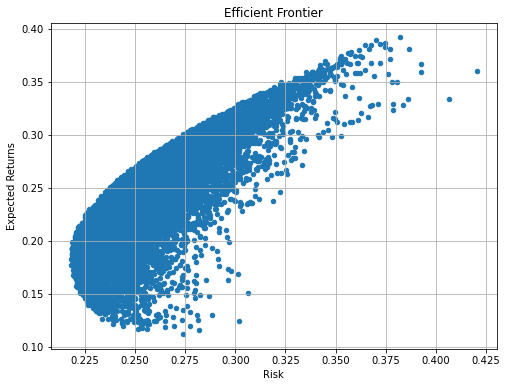

In [6]:
# 2만개 위험-수익률 조합에 대한 시각화
df.plot.scatter(x='Risk', y='Returns', figsize=(8, 6), grid=True)
plt.title('risk and return') 
plt.xlabel('Risk') 
plt.ylabel('Expected Returns') 
plt.show() 

In [8]:
# 최소분산이 되는 지점과 최대 샤프비율을 가지는 지점을 확인해보자.
# 위의 과정을 따라한다.

port_ret = [] 
port_risk = [] 
port_weights = []
sharpe_ratio = [] 

np.random.seed(0)
for _ in range(20000): 
    weights = np.random.random(len(stocks)) 
    weights /= np.sum(weights) 

    returns = np.dot(weights, annual_ret) 
    risk = np.sqrt(np.dot(weights.T, np.dot(annual_cov, weights))) 

    port_ret.append(returns) 
    port_risk.append(risk) 
    port_weights.append(weights)

    # 샤프비율 계산. 정확한 값을 구하는 식은 아니지만 최대 사프비율을 가지는 점이 어딘지 확인하려면 rf=0이라 가정해도 비교에는 무리가 없음
    sharpe_ratio.append(returns/risk)  # 단순화를 위해 rf=0 이라 가정

portfolio = {'Returns': port_ret, 'Risk': port_risk, 'Sharpe': sharpe_ratio}

for i, s in enumerate(stocks): 
    portfolio[s] = [weight[i] for weight in port_weights] 
df = pd.DataFrame(portfolio) 
df = df[['Returns', 'Risk', 'Sharpe'] + [s for s in stocks]] 

# 샤프비율 최대지점 값 출력
max_sharpe = df.loc[df['Sharpe'] == df['Sharpe'].max()]
print(max_sharpe)

# 최소분산 지점 값 출력
min_risk = df.loc[df['Risk'] == df['Risk'].min()]
print(min_risk)  


Returns      Risk   Sharpe      삼성전자    SK하이닉스  삼성바이오로직스     NAVER  \
7895  0.302947  0.275901  1.09803  0.279204  0.006836  0.345065  0.128132   

          셀트리온  
7895  0.240763  
       Returns      Risk    Sharpe      삼성전자   SK하이닉스  삼성바이오로직스     NAVER  \
5514  0.182838  0.217993  0.838732  0.419333  0.10944  0.100884  0.290074   

          셀트리온  
5514  0.080269  


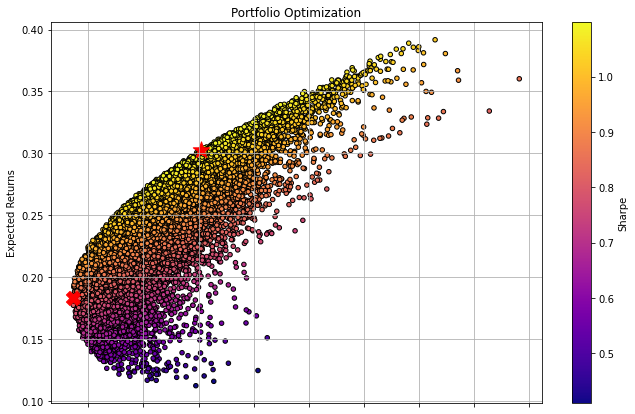

In [9]:
# 시각화 : 다양한 무작위 포트폴리오 비중에 대한 수익률과 변동성의 기댓값
# 앞에서 그린 포물선 모양에 최대샤프비율 지점과 최소분산지점 각각 표시
df.plot.scatter(x='Risk', y='Returns', c='Sharpe', cmap='plasma',
    edgecolors='k', figsize=(11,7), grid=True)  
plt.scatter(x=max_sharpe['Risk'], y=max_sharpe['Returns'], c='r', 
    marker='*', s=300)  
plt.scatter(x=min_risk['Risk'], y=min_risk['Returns'], c='r', 
    marker='X', s=200)  
plt.title('Portfolio Optimization') 
plt.xlabel('Risk') 
plt.ylabel('Expected Returns') 
plt.show()

In [10]:
# 수치적으로 정확히 최적화 해보자
# 2만개의 무작위 포트폴리오중 샤프지수를 최대화 하는 종목 비중을 최적화를 이용해 구성하고 그 때 결과를 확인한다.
import scipy.optimize as sco

# 주식 비중에 대한 벡터/배열을 입력하여 주요 포트폴리오 통계(수익률, 변동성, 샤프지수)를 출력하는 함수
def statistics(weights):

    weights=np.array(weights)
    returns = np.dot(weights, annual_ret) 
    risk = np.sqrt(np.dot(weights.T, np.dot(annual_cov, weights)))
    # 무위험 수익률은 0이라 가정 
    sharpe_ratio = returns/risk

    return np.array([returns, risk, sharpe_ratio])

# 샤프 지수를 최대화하기 위해서는 샤프 지수의 음수 값을 최소화
def min_func_sharpe(weights):
    return -statistics(weights)[2]

# type으로 제약조건식이 등식인지, 부등식인지 정하고, fun에 관련 제약식을 함수로 적어줌
# 모든 입력 변수(주식 비중)의 합이 1이 되어야 한다.
cons = ({'type':'eq', 'fun':lambda x:np.sum(x)-1})

# 종목별 최소 최대 비중 선정. lb, ub에 원하는 값 입력
# lbound  = np.repeat(lb, len(stock))
# ubound  = np.repeat(ub, len(stock))
# bnds = tuple(zip(lbound, ubound))

# 종목 별 최소, 최대 비중을 정해줘야 함. 튜플의 형태로 최소를 0, 최대를 1로 지정함.
# 만약세 최소를 0이라고 지정 안해주면 음수값이 될 수 있는, 즉 포트폴리오 구성에 공매도를 허용하는 것과 같다.
bnds = tuple((0,1) for x in range(len(stocks)))
print(bnds)
# 초기 비중 설정. 종목별로 동일하게 줌. 즉 주식 비웅에 대한 초깃값 리스트 균등 배분
initial_weights = len(stocks)*[1./len(stocks)]
initial_weights


((0, 1), (0, 1), (0, 1), (0, 1), (0, 1))


[0.2, 0.2, 0.2, 0.2, 0.2]

In [11]:
%%time
# 최적 포트폴리오 계산은 제약 조건 하에서의 최적화 문제이므로 scipy의 minmize함수를 사용하였다.
# SLSQP는 비선형 최적화 구하는 알고리즘. 일반적으로 선형최적화 알고리즘으로 심플렉스를 많이쓰고 엑셀에서는 비선형 최적화로 GRG 사용
# 결과를 opts라는 객체에 저장
opts = sco.minimize(min_func_sharpe, initial_weights, method='SLSQP', bounds=bnds, constraints=cons)

Wall time: 13 ms


In [12]:
# 최적화 결과
opts

     fun: -1.0996251118433216
     jac: array([-1.32039189e-04,  1.78370267e-01,  5.42342663e-04, -3.34784389e-04,
       -5.03674150e-04])
 message: 'Optimization terminated successfully.'
    nfev: 51
     nit: 7
    njev: 7
  status: 0
 success: True
       x: array([2.90281764e-01, 5.44817996e-17, 3.59079551e-01, 1.19564070e-01,
       2.31074615e-01])

In [13]:
# 최적화 했을 때 통계치(수익률, 리스크, 샤프지수) 확인
statistics(opts['x'].round(3))

array([0.30527082, 0.27761356, 1.09962506])

In [14]:
# 포트폴리오의 분산 최소화. 변동성을 최소화 하는 것과 같음
def min_func_variance(weights):
    return statistics(weights)[1]**2

cons = ({'type':'eq', 'fun':lambda x:np.sum(x)-1})
bnds = tuple((0,1) for x in range(len(stocks)))
initial_weights = len(stocks)*[1./len(stocks)]

# 최적화 결과는 최소 분산 포트폴리오가 됨
optvs = sco.minimize(min_func_variance, initial_weights, method='SLSQP', bounds=bnds, constraints=cons)

In [52]:
# 포트폴리오의 분산 최소화를 했을 때 수익률, 리스크, 샤프지수 확인

statistics(optvs['x'].round(3))

array([0.17876817, 0.21784954, 0.82060382])

In [15]:
# 지금까지는 무작위로 2만개의 포트폴리오를 구성하고 그 중 최적 포트폴리오가 무엇인지만 확인했다.
# 이번에는 좀 더 수학적인 최적해를 찾아보자 (포물선으로 나타남. 수학적인 증명은 CAPM.pdf 확인)
# 최적 포트폴리오 집합(목표 수익률 수준에 대해 최소 변동성을 가지는 모든 포트폴리오 혹은 목표 위험 수준에 대해 최대 수익률을 가지는 모든 포트폴리오) 즉 최소 분산 포트폴리오임 (Minimum Variance Portfolio)를 구성해보자.

# 앞의 과정의 2만개의 조합을 생성한 후 최적조합을 선택하는 것이었다면 이번에는 목표 수익률을 고정시키고
# 그 수익률을 달성하면서 최소의 변동성을 가지는 포트폴리오 비중을 계산하는 방법을 사용해보자.

# 제약 조건
cons = ({'type':'eq', 'fun':lambda x:statistics(x)[0]-goal_ret},
        {'type':'eq', 'fun':lambda x:np.sum(x)-1})
bnds = tuple((0,1) for x in range(len(stocks)))
initial_weights = len(stocks)*[1./len(stocks)]

# 변동성 최소화. 변동성 값만 반환
def min_func_port(weights):
    return statistics(weights)[1]

set_ret = np.linspace(0.0, 0.4, 100)
goal_vols = []

# 여러가지 목표 수익률 값(goal_ret)에 대해 반복 한다. 제약조건도 그에 따라 변경된다.
for goal_ret in set_ret :
    cons = ({'type':'eq', 'fun':lambda x:statistics(x)[0]-goal_ret},
        {'type':'eq', 'fun':lambda x:np.sum(x)-1})
    eff = sco.minimize(min_func_port, initial_weights,method='SLSQP',bounds=bnds, constraints=cons)
    goal_vols.append(eff['fun'])

goal_vols=np.array(goal_vols)
goal_vols

array([0.36059665, 0.36059665, 0.36059665, 0.36059665, 0.36059665,
       0.36059665, 0.36059665, 0.36059665, 0.36059665, 0.36059665,
       0.36059665, 0.36059665, 0.36059665, 0.36059665, 0.36059665,
       0.36059665, 0.36059665, 0.36059665, 0.36059665, 0.36059665,
       0.36059665, 0.36059665, 0.34725403, 0.32395202, 0.30400682,
       0.28811211, 0.27492597, 0.26308827, 0.25278893, 0.24422254,
       0.23757662, 0.23301556, 0.23047056, 0.22846723, 0.22668393,
       0.22512661, 0.22376493, 0.22253582, 0.22143976, 0.22047874,
       0.21965453, 0.21896866, 0.21842245, 0.21801696, 0.21775296,
       0.21763098, 0.2176505 , 0.21781279, 0.21811696, 0.21856242,
       0.21914832, 0.21987298, 0.22073598, 0.2217353 , 0.22286911,
       0.22413536, 0.22553179, 0.22705644, 0.22870542, 0.23048439,
       0.23240408, 0.23446053, 0.23665103, 0.23897194, 0.24141941,
       0.2439884 , 0.24667627, 0.24947917, 0.25239333, 0.255415  ,
       0.25853956, 0.26176386, 0.26508454, 0.26849779, 0.27200

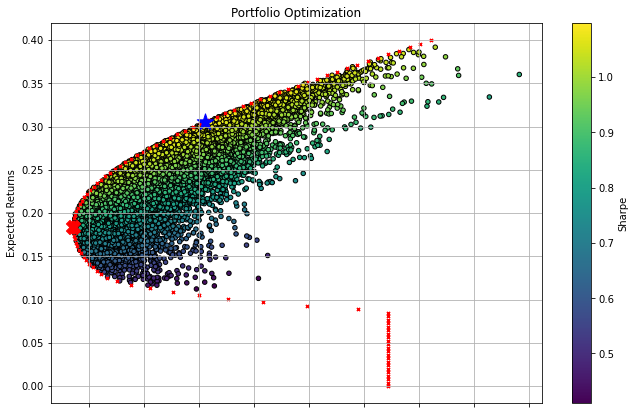

In [16]:
# 2만개를 무작위 고른 포트폴리오 종목들 시각화
df.plot.scatter(x='Risk', y='Returns', c='Sharpe', cmap='viridis',
    edgecolors='k', figsize=(11,7), grid=True) 

# 이론적 효율적 투자선. x 표시는 특정 수익률 목표에 대한 최적 포트폴리오를 표시.
# 효율적 투자선은 모든 최소 분산 포트폴리오보다 수익률이 높은 모든 최적 포트폴리오들로 구성됨.
plt.scatter(x=goal_vols, y=set_ret, c='r', marker='x', s=10) 

# 최대 샤프지수 포트폴리오
plt.scatter(x=statistics(opts['x'])[1], y=statistics(opts['x'])[0], c='b', 
    marker='*', s=300) 

# 최소 분산 포트폴리오 
plt.scatter(x=statistics(optvs['x'])[1], y=statistics(optvs['x'])[0], c='r', 
    marker='X', s=200)  
plt.title('Portfolio Optimization')
plt.xlabel('Risk') 
plt.ylabel('Expected Returns') 
plt.show()

In [17]:
# 자본시장선 CML
# 무위험 자산이 포함된 최적 포트폴리오는 어떻게 구할까?
# 무위험 자산의 위험-수익률을 지나면서 효율적 투자선에 접하는 접선에 있는 포트폴리오

# 효율적 투자선의 함수 형태 근사와 1차 도함수가 필요함.
import scipy.interpolate as sci
# 보간 함수는 관측점 자체도 정확하게 재현해야 하고 각 관측 점에서 연속 미분 가능한 함수 여야함.
# 연속 미분 가능하기 위해서는 보간 함수가 최소 3차 이상, 즉 큐빅 스플라인 함수이어야 함.
# splrep -> fit, splrev -> value


# 큐빅 스플라인 보간법을 사용하려면 효율적 투자선에 있는 포트폴리오만 추출해야함
ind = np.argmin(goal_vols)
evols = goal_vols[ind:]
erets = set_ret[ind:]

# 큐빅 스플라인 보간법
tck = sci.splrep(evols, erets)

def f(x):
    # 효율적 투자선을 표현하는 연속 미분 가능한 함수 (스플라인 근사)
    return sci.splev(x, tck, der=0)

def Df(x):
    # 효율적 투자선을 미분한 1차 도함수
    return sci.splev(x, tck, der=1)

# 우리가 찾는건 무위험 자산을 지나면서 효율적 투자선에 접하는 직선을 묘사하는 함수
# t(x) = a+bx

# 함수 t(x)가 만족해야 할 세 가지 조건
# t(0) = rf      a - rf = 0
# t(x) = f(x)    a+bx - f(x) = 0
# t'(x) = f'(x)  b - f'(x) = 0

# 입력변수 p=(a,b,x)
# 효율적 투자선이나 그 도함수에 대한 닫힌 형태의 수식이 없음. 위 연립방정식도 수치적으로 풀어야함
def equations(p, rf=0.01):
    eq1 = p[0]-rf
    eq2 = p[0] + p[1]*p[2] - f(p[2])
    eq3 = p[1] - Df(p[2])

    return eq1, eq2, eq3

# fsolve를 활용해서 최적화. 최적화의 성공 여부가 초기 입력 변수에 의존하기 때문에 초기조건 잘못주면 접선 안나옴
# 일반적으로 초기 입력 변수는 시행 착오와 추측을 조합하여 결정한다.
opt=sco.fsolve(equations, [0.01, 0.5, 0.3])

# 수치 최적화 결과를 확인
opt

array([0.01      , 1.06396836, 0.2834658 ])

In [18]:
# 방정식 만족하는지 확인
np.round(equations(opt),6)

array([ 0., -0., -0.])

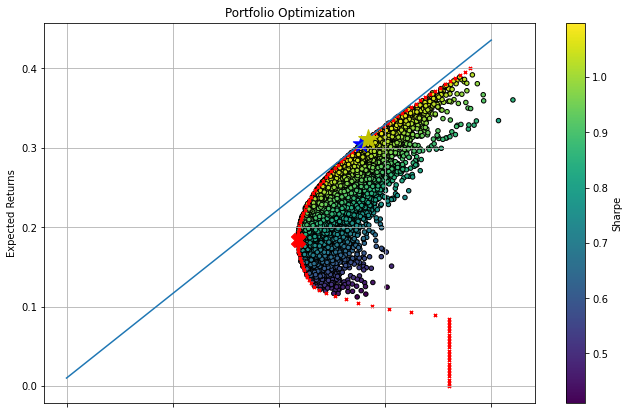

In [19]:
# 무작위 포트폴리오
df.plot.scatter(x='Risk', y='Returns', c='Sharpe', cmap='viridis',
    edgecolors='k', figsize=(11,7), grid=True) 

# 효율적 투자선
plt.scatter(x=goal_vols, y=set_ret, c='r', marker='x', s=10) 

# 최대 샤프지수 포트폴리오
plt.scatter(x=statistics(opts['x'])[1], y=statistics(opts['x'])[0], c='b', 
    marker='*', s=300) 

# 최소 분산 포트폴리오 
plt.scatter(x=statistics(optvs['x'])[1], y=statistics(optvs['x'])[0], c='r', 
    marker='X', s=200) 

# 자본시장선
cx= np.linspace(0.0,0.4)
plt.plot(cx, opt[0]+opt[1]*cx, lw=1.5)
plt.plot(opt[2], f(opt[2]), 'y', marker='*', markersize=20)

plt.grid(True)
plt.title('Portfolio Optimization')
plt.xlabel('Risk') 
plt.ylabel('Expected Returns') 
plt.show()

In [20]:
# 자본시장선에 접하는 최적포트폴리오의 비중
cons = ({'type':'eq', 'fun':lambda x:statistics(x)[0]-f(opt[2])},
        {'type':'eq', 'fun':lambda x:np.sum(x)-1})
cml = sco.minimize(min_func_port, initial_weights,method='SLSQP',bounds=bnds, constraints=cons)
cml['x'].round(3)

array([0.278, 0.   , 0.374, 0.11 , 0.238])

## 다양한 포트폴리오 구성 방법

- 최대 분산 효과 포트폴리오(MDP) : MDP.ipynb 참고

- 위험 균형 포트폴리오 : risk_parity.ipynb 참고

- 인덱스 포트폴리오 : 언젠가는 구현해보겠지?

- 참고 : https://hyunyulhenry.github.io/quant_cookbook/%ED%8F%AC%ED%8A%B8%ED%8F%B4%EB%A6%AC%EC%98%A4-%EA%B5%AC%EC%84%B1.html#%EC%9D%B8%EB%8D%B1%EC%8A%A4-%ED%8F%AC%ED%8A%B8%ED%8F%B4%EB%A6%AC%EC%98%A4-%EA%B5%AC%EC%84%B1%ED%95%98%EA%B8%B0


## 포트폴리오 심화 공부

- 이외에 퀀트로 성장하기 위한 기초적인 지식과 모델 구성 방법에 대한 내용은 30기의 방학스터디 내용에서 확인할 수 있습니다.

- 참고로 앞서 말씀드렸다 시피 정확한 데이터를 구하는 것이 중요하고 파이썬은 퀀트 모델을 만들고 백테스트 하기에 불편합니다.

- R을 사용할 줄 아신다면 R을 사용하시고, 모르더라도 배워서 사용하는 걸 추천합니다.

- 30기의 파이썬을 활용한 포트폴리오 및 퀀트 스터디 내용은 다음을 통해서 확인할 수 있고

    - 사이트 참고 : https://www.notion.so/noinho/portfolio-study-500f1712941b42a99cfba352919d0e50

- 코드는 다음을 통해서 확인할 수 있습니다.

    - 사이트 참고 : https://github.com/nosy0411/Programming_for_Finance